In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import missingno as msno

import plotly.graph_objects as go
from plotly.subplots import make_subplots

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

# I. Introduction

We aim to accomplish the following in this study

1. Build a prediction model that will attach a probability of churn on each bank customer
2. Identify and visualize which factors contribute to customer churn:


In [2]:
df = pd.read_csv("./dataset.csv", sep=";")

df.head()

,id_client,genre,espace_client_web,assurance_vie,banque_principale,anciennete_mois,compte_epargne,credit_autres,cartes_bancaires,compte_courant,espace_client,PEA,assurance_auto,assurance_habitation,credit_immo,type,compte_titres,methode_contact,agios_6mois,interet_compte_epargne_total,age,segment_client,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,branche,churn
0,3463,H,0.0,non,non,37.0,oui,consommation,medium,oui,non,non,non,oui,non,pro,oui,mail,91.15,3369.25,30.0,A4,3788.182745,5945.077267,10803.089959,13030.928518,16070.855640,17019.439852,22021.785596,21216.423900,23817.283384,24696.468636,NaN,29133.894497,27300.071162,26686.065056,29058.920542,30081.575645,34737.732143,35668.424115,42088.923198,42764.084114,1169.512733,1476.735096,2906.612116,4238.286461,6541.289876,5604.843020,8529.610222,6698.675290,8299.637103,8584.519863,8285.480439,13545.535937,12243.785415,12140.590245,9013.777747,11604.261036,16390.415593,14631.204899,23988.305931,NORD-OUEST,non
1,1869,H,0.0,oui,oui,72.0,oui,consommation,premium,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,NaN,non,sms,24.10,1734.65,53.0,B1,13256.481090,13857.639282,16921.648902,15994.602590,19860.270780,21737.139931,24324.244241,27392.121666,29288.212735,31119.430165,32536.150958,33491.895175,36037.986828,37906.966495,37065.723883,36662.943135,35995.908243,38504.550415,39879.461696,40351.659648,4040.767255,2893.438448,4522.323311,3289.390612,8409.097755,5939.488953,6615.523133,8423.928612,9664.847859,12811.297554,13850.568156,14014.989673,15508.546834,17547.988381,15470.524076,17537.628474,17410.472648,21258.908987,21554.411100,NORD-OUEST,non
2,3760,H,0.0,non,non,3.0,oui,NaN,medium,non,non,oui,non,non,non,pro,oui,sms,73.60,232.5,41.0,B2,6485.760225,8854.292447,14631.403255,16403.253266,20053.910352,24404.311456,NaN,NaN,28995.145157,31381.332311,34524.328158,37696.137418,40010.389451,39991.336181,42066.099905,46159.092725,46548.328134,49017.799992,50879.800091,50811.414357,641.888116,2194.386006,4719.557270,5592.923372,6652.559765,11578.741807,10784.182742,10408.668590,11426.817452,11686.025962,16764.322564,17239.846026,19479.322456,21343.802381,24084.291026,25823.493343,25839.829752,25587.814976,29736.376226,NORD-OUEST,non
3,3820,H,1.0,oui,non,72.0,oui,consommation,medium,oui,oui,oui,oui,NaN,oui,pro,oui,sms,112.90,8061.5,44.0,C4,3023.518886,3657.280381,3583.864370,7048.335851,10851.522505,13233.449469,17043.445440,17315.324866,18409.009200,20992.136261,25680.971636,26021.839063,28987.451966,28467.733523,30863.437099,NaN,35443.442964,42466.157213,47617.669527,50441.094534,846.588009,300.647893,NaN,623.554669,1411.534141,2919.154899,4837.868424,6297.571985,4694.966744,8601.779273,6895.959437,9229.470887,11935.244779,11014.748509,11791.353542,16354.051367,15449.967495,21149.789933,29211.314803,NORD-OUEST,non
4,1463,F,0.0,non,non,4.0,oui,permanent,medium,non,non,non,non,non,non,pro,non,mail,70.40,281,32.0,B2,5108.994106,4922.134385,5619.387384,5967.906772,11720.904970,15561.132418,14934.624990,16295.563660,18983.711353,20997.917940,23264.257596,21750.759870,19947.127129,20916.130056,21685.913416,23620.334323,24778.901653,22870.646400,25475.278671,28725.910656,533.782193,977.257244,782.571668,1830.376484,2025.910611,2696.413807,2883.741954,4206.610511,4990.114457,7081.966623,8472.294920,9008.641700,5875.342745,6101.742525,8026.508871,10361.246523,10575.966610,6714.625315,9101.978017,NORD-OUEST,oui


# II. Understanding the data

Each row represents a customer of the bank and each column one attribute of the customer.

The dataset includes info about :

- **Customer who left in the last 3 months** :
  - churn
- **Services contracted by the customer** :
  - assurance vie
  - Compte epargne
  - Credits
  - Carte Bancaire
  - Compte Courant
  - PEA
  - Assurance Auto
  - Asssurance Habitation
  - Credit Immo
  - Compte Titres
- **Customer account information**:
  - Banque principale
  - ancienneté
  - type de compte
  - Agios (6 derniers mois)
  - Intérêts générés par le compte épargne
  - segment_client
- **Type of access to the bank platform**:
  - espace client
  - espace client web
  - methode de contact
- **Socio-demographic information**:
  - Genre
  - Age
  - Segment_Client
- **Anonymized information**:
  - var_0, var_1, ..., var_38


In [3]:
df.shape

(7043, 63)

In [4]:
len(df.columns)

63

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 63 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id_client                     7043 non-null   int64  
 1   genre                         6915 non-null   object 
 2   espace_client_web             6916 non-null   float64
 3   assurance_vie                 6912 non-null   object 
 4   banque_principale             6921 non-null   object 
 5   anciennete_mois               6909 non-null   float64
 6   compte_epargne                6894 non-null   object 
 7   credit_autres                 6916 non-null   object 
 8   cartes_bancaires              6893 non-null   object 
 9   compte_courant                6896 non-null   object 
 10  espace_client                 6912 non-null   object 
 11  PEA                           6897 non-null   object 
 12  assurance_auto                6907 non-null   object 
 13  ass

In [6]:
df.replace(r"^\s*$", np.nan, regex=True, inplace=True)

df.set_index("id_client")

df = df.drop(["id_client"], axis=1)

In [7]:
df.interet_compte_epargne_total = pd.to_numeric(df.interet_compte_epargne_total)

df.loc[df.espace_client_web == 1, "espace_client_web"] = "oui"
df.loc[df.espace_client_web == 0, "espace_client_web"] = "non"
# df.espace_client_web = df.espace_client_web.astype("str")

C:\Users\HO.CAZEFACK\AppData\Local\Temp\ipykernel_7536\3232725488.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'oui' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[df.espace_client_web == 1, "espace_client_web"] = "oui"


We can observe some missing values around the dataset. Let's deep dive into that


<AxesSubplot:>

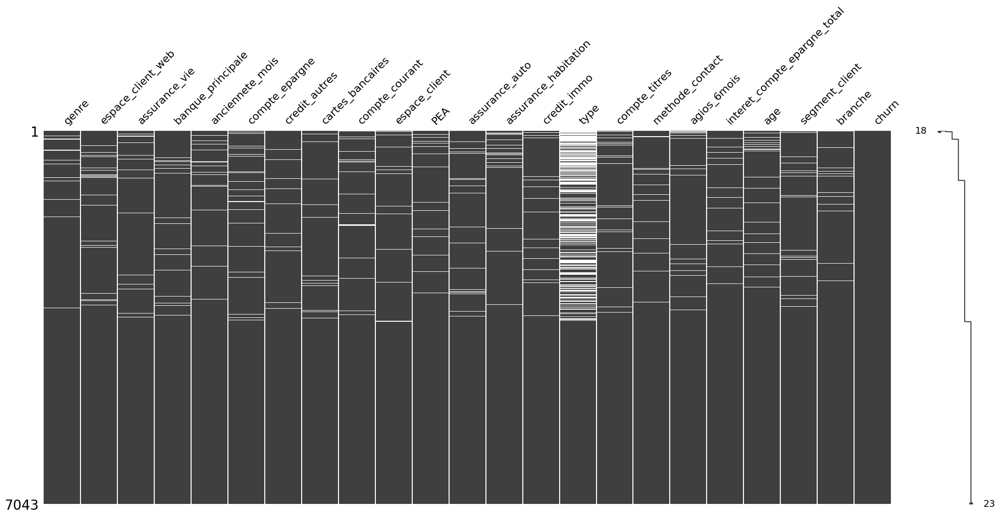

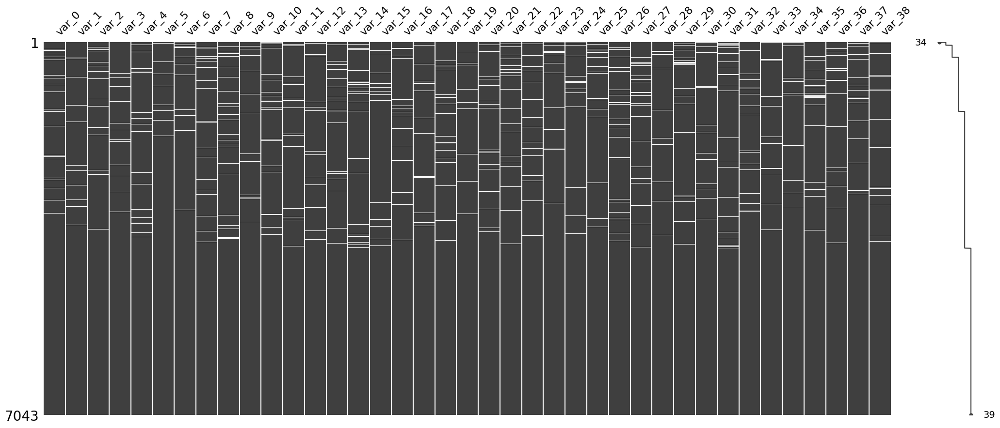

In [8]:
public_cols = [x for x in df.columns if not x.startswith("var_")]

anon_cols = [x for x in df.columns if x.startswith("var_")]

msno.matrix(df[public_cols], sort="ascending")

msno.matrix(df[anon_cols], sort="ascending")

We can observe some missing values around most columns (the most being the column 'type'). But luckily, no missing values detected on the Target column **churn**.

We can see there are more missing values in the anonymized columns. So there should be some data manipulation operation done on them to fill the blanks.


In [15]:
# Count rows with at least one NaN
count_nan_rows = df.isna().any(axis=1).median()

print("Number of rows with at least one NaN:", count_nan_rows)

Number of rows with at least one NaN: 1.0


# Data Manipulation


In [ ]:
df.head()

,genre,espace_client_web,assurance_vie,banque_principale,anciennete_mois,compte_epargne,credit_autres,cartes_bancaires,compte_courant,espace_client,PEA,assurance_auto,assurance_habitation,credit_immo,type,compte_titres,methode_contact,agios_6mois,interet_compte_epargne_total,age,segment_client,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,branche,churn
0,H,non,non,non,37.0,oui,consommation,medium,oui,non,non,non,oui,non,pro,oui,mail,91.15,3369.25,30.0,A4,3788.182745,5945.077267,10803.089959,13030.928518,16070.855640,17019.439852,22021.785596,21216.423900,23817.283384,24696.468636,NaN,29133.894497,27300.071162,26686.065056,29058.920542,30081.575645,34737.732143,35668.424115,42088.923198,42764.084114,1169.512733,1476.735096,2906.612116,4238.286461,6541.289876,5604.843020,8529.610222,6698.675290,8299.637103,8584.519863,8285.480439,13545.535937,12243.785415,12140.590245,9013.777747,11604.261036,16390.415593,14631.204899,23988.305931,NORD-OUEST,non
1,H,non,oui,oui,72.0,oui,consommation,premium,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,NaN,non,sms,24.10,1734.65,53.0,B1,13256.481090,13857.639282,16921.648902,15994.602590,19860.270780,21737.139931,24324.244241,27392.121666,29288.212735,31119.430165,32536.150958,33491.895175,36037.986828,37906.966495,37065.723883,36662.943135,35995.908243,38504.550415,39879.461696,40351.659648,4040.767255,2893.438448,4522.323311,3289.390612,8409.097755,5939.488953,6615.523133,8423.928612,9664.847859,12811.297554,13850.568156,14014.989673,15508.546834,17547.988381,15470.524076,17537.628474,17410.472648,21258.908987,21554.411100,NORD-OUEST,non
2,H,non,non,non,3.0,oui,NaN,medium,non,non,oui,non,non,non,pro,oui,sms,73.60,232.50,41.0,B2,6485.760225,8854.292447,14631.403255,16403.253266,20053.910352,24404.311456,NaN,NaN,28995.145157,31381.332311,34524.328158,37696.137418,40010.389451,39991.336181,42066.099905,46159.092725,46548.328134,49017.799992,50879.800091,50811.414357,641.888116,2194.386006,4719.557270,5592.923372,6652.559765,11578.741807,10784.182742,10408.668590,11426.817452,11686.025962,16764.322564,17239.846026,19479.322456,21343.802381,24084.291026,25823.493343,25839.829752,25587.814976,29736.376226,NORD-OUEST,non
3,H,oui,oui,non,72.0,oui,consommation,medium,oui,oui,oui,oui,NaN,oui,pro,oui,sms,112.90,8061.50,44.0,C4,3023.518886,3657.280381,3583.864370,7048.335851,10851.522505,13233.449469,17043.445440,17315.324866,18409.009200,20992.136261,25680.971636,26021.839063,28987.451966,28467.733523,30863.437099,NaN,35443.442964,42466.157213,47617.669527,50441.094534,846.588009,300.647893,NaN,623.554669,1411.534141,2919.154899,4837.868424,6297.571985,4694.966744,8601.779273,6895.959437,9229.470887,11935.244779,11014.748509,11791.353542,16354.051367,15449.967495,21149.789933,29211.314803,NORD-OUEST,non
4,F,non,non,non,4.0,oui,permanent,medium,non,non,non,non,non,non,pro,non,mail,70.40,281.00,32.0,B2,5108.994106,4922.134385,5619.387384,5967.906772,11720.904970,15561.132418,14934.624990,16295.563660,18983.711353,20997.917940,23264.257596,21750.759870,19947.127129,20916.130056,21685.913416,23620.334323,24778.901653,22870.646400,25475.278671,28725.910656,533.782193,977.257244,782.571668,1830.376484,2025.910611,2696.413807,2883.741954,4206.610511,4990.114457,7081.966623,8472.294920,9008.641700,5875.342745,6101.742525,8026.508871,10361.246523,10575.966610,6714.625315,9101.978017,NORD-OUEST,oui


In [ ]:
df.loc[df.churn == "oui", "churn"] = 1
df.loc[df.churn == "non", "churn"] = 0

# Feature Distribution


In [ ]:
cat_cols = [x for x in df.columns if df[x].dtype == "object"]

num_cols = [x for x in df.columns if df[x].dtype != "object"]

cat_cols

['genre',
 'espace_client_web',
 'assurance_vie',
 'banque_principale',
 'compte_epargne',
 'credit_autres',
 'cartes_bancaires',
 'compte_courant',
 'espace_client',
 'PEA',
 'assurance_auto',
 'assurance_habitation',
 'credit_immo',
 'type',
 'compte_titres',
 'methode_contact',
 'segment_client',
 'branche',
 'churn']

In [ ]:
fig = px.pie(df, names="churn", title="Percentage of Churn Customer")
fig.show()

We can observe a huge imbalance in the target distribution over here


In [ ]:
len(df[df.churn == 0])

5174

In [ ]:
for feat in cat_cols[:-1]:
    # Replace Unknown values with 'inconnu'
    df.loc[df[feat].isnull(), feat] = "inconnu"

    x_df = df[[feat, "churn"]].value_counts(dropna=False).reset_index()

    fig = make_subplots(
        rows=1, cols=2, specs=[[{"type": "domain"}, {"type": "domain"}]]
    )

    x_df_churn = x_df[x_df.churn == 1]
    x_df_no_churn = x_df[x_df.churn != 1]

    print(feat)

    fig.add_trace(
        go.Pie(
            labels=x_df_no_churn[feat],
            values=x_df_no_churn["count"].values,
            name="No Churn",
        ),
        1,
        1,
    )

    fig.add_trace(
        go.Pie(
            labels=x_df_churn[feat], values=x_df_churn["count"].values, name="Churn"
        ),
        1,
        2,
    )

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=0.4, hoverinfo="label+percent+name")

    fig.update_layout(
        title_text=f"{feat} Distribution",
        # Add annotations in the center of the donut pies.
        annotations=[
            dict(text="No Churn", x=0.18, y=0.5, font_size=20, showarrow=False),
            dict(text="Yes Churn", x=0.82, y=0.5, font_size=20, showarrow=False),
        ],
    )
    fig.show()

genre


espace_client_web


assurance_vie


banque_principale


compte_epargne


credit_autres


cartes_bancaires


compte_courant


espace_client


PEA


assurance_auto


assurance_habitation


credit_immo


type


compte_titres


methode_contact


segment_client


branche


Features with Big Target Distribution difference

- espace_client_web à 0
  - Legere sur-representation des personens avec accès à un espace client web dans les clients churn
- Assurance vie
  - Sur-representation des clients sans assurances vies
- Banque principale
  - sur-representation des clients dont la banque n'est pas la banque principale
- cartes bancaires
  - Sur-representation des clients avec une carte bancaire medium dans les churn
- compte courant
  - Sur-representation des clients sans compte courant
- espace client
  - Sur-representation des clients sans espace client
- PEA Distribution
  - Sur-representation des clients sans PEA
- Assurance Auto :
  - Sur-representation des clients sans assurance auto
- Assurance habitation :
  - Sur-representation des clients sans assurance habitation
- Credit immo
  - Sur-representation des clients sans credit immo
- Type De compte
  - Sur-representation des clients avec un compte pro
- Compte titres
  - Sur-representation des clients avec un compte titre
- Methode de contact
  - sur representation des clients choisissant les mails
- Segment client :
  - Certains segments n'apparaissent que dans le churn


# Numerical Features


In [ ]:
for feat in num_cols:
    fig = px.box(df, x="churn", y=feat, title=f"{feat} Distribution")
    fig.show()

    # Fill missing values with mean
    df.loc[df[feat].isnull(), feat] = df[feat].mean()

In [ ]:
corr = df[num_cols + ["churn"]].corr()

In [ ]:
fig = px.imshow(corr, text_auto=True)
fig.show()

We can observe a huge correlation between the annonimyzed variables. We can see 2 groups of the variables (var_0 -> var_19) and (var_20 -> var_38).

We can also notice that the **agios_6mois** is the most correlated to the churn rate.


# Data Preprocessing


<AxesSubplot:>

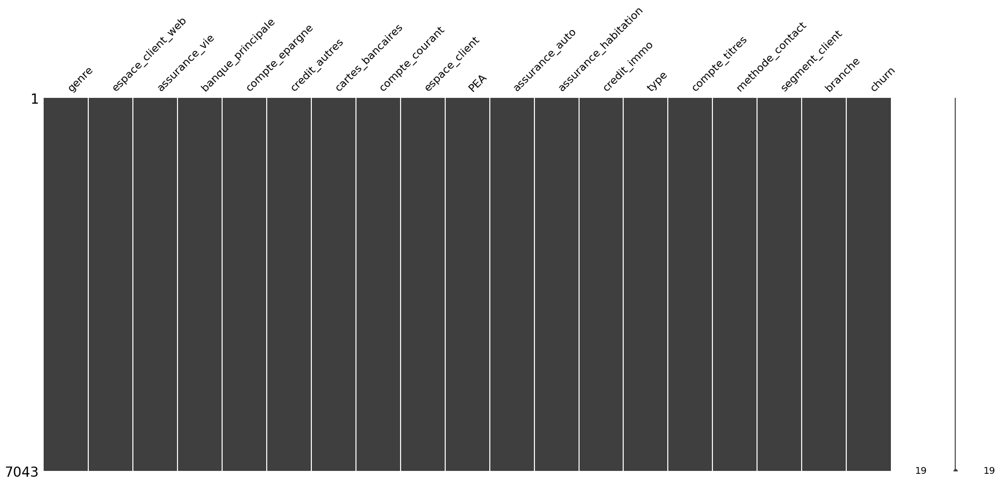

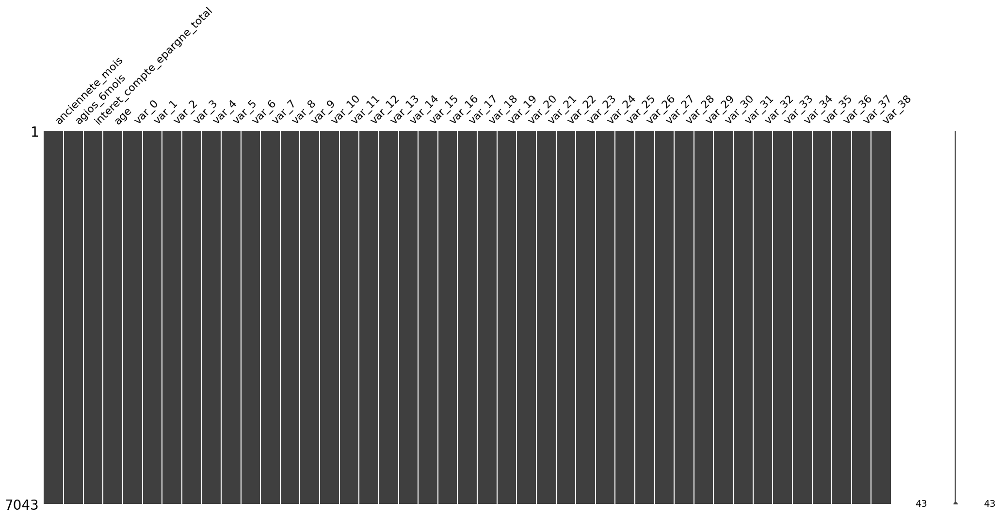

In [ ]:
msno.matrix(df[cat_cols], sort="ascending")

msno.matrix(df[num_cols], sort="ascending")

We have a clean Dataset now


In [ ]:
len(cat_cols)

19

## Encoding Categorical Variables with more than 2 Values


In [ ]:
df.sort_values("agios_6mois", ascending=True, inplace=True)
# Get dummies
df_cat_dummies = pd.get_dummies(df[cat_cols], prefix_sep="_", drop_first=True)

df_cat_dummies.head()

,genre_H,genre_inconnu,espace_client_web_non,espace_client_web_oui,assurance_vie_non,assurance_vie_oui,banque_principale_non,banque_principale_oui,compte_epargne_non,compte_epargne_oui,credit_autres_consommation,credit_autres_inconnu,credit_autres_permanent,cartes_bancaires_inconnu,cartes_bancaires_medium,cartes_bancaires_premium,compte_courant_non,compte_courant_oui,espace_client_non,espace_client_oui,PEA_non,PEA_oui,assurance_auto_non,assurance_auto_oui,assurance_habitation_non,assurance_habitation_oui,credit_immo_non,credit_immo_oui,type_perso,type_pro,compte_titres_non,compte_titres_oui,methode_contact_inconnu,methode_contact_mail,methode_contact_sms,methode_contact_telephone,segment_client_A2,segment_client_A3,segment_client_A4,segment_client_B1,segment_client_B2,segment_client_B3,segment_client_B4,segment_client_C1,segment_client_C2,segment_client_C3,segment_client_C4,segment_client_D1,segment_client_D2,segment_client_D3,segment_client_inconnu,branche_NORD-EST,branche_NORD-OUEST,branche_OUTRE-MER,branche_SUD-EST,branche_SUD-OUEST,branche_inconnu,churn_1
5095,True,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2217,True,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
284,False,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False
4271,False,False,True,False,False,True,False,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
838,False,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False


In [ ]:
encoded_df = pd.concat([df_cat_dummies, df[num_cols]], axis=1)

In [ ]:
encoded_df.rename(inplace=True, columns={"churn_1": "churn"})

encoded_df.head()

,genre_H,genre_inconnu,espace_client_web_non,espace_client_web_oui,assurance_vie_non,assurance_vie_oui,banque_principale_non,banque_principale_oui,compte_epargne_non,compte_epargne_oui,credit_autres_consommation,credit_autres_inconnu,credit_autres_permanent,cartes_bancaires_inconnu,cartes_bancaires_medium,cartes_bancaires_premium,compte_courant_non,compte_courant_oui,espace_client_non,espace_client_oui,PEA_non,PEA_oui,assurance_auto_non,assurance_auto_oui,assurance_habitation_non,assurance_habitation_oui,credit_immo_non,credit_immo_oui,type_perso,type_pro,compte_titres_non,compte_titres_oui,methode_contact_inconnu,methode_contact_mail,methode_contact_sms,methode_contact_telephone,segment_client_A2,segment_client_A3,segment_client_A4,segment_client_B1,segment_client_B2,segment_client_B3,segment_client_B4,segment_client_C1,segment_client_C2,segment_client_C3,segment_client_C4,segment_client_D1,segment_client_D2,segment_client_D3,segment_client_inconnu,branche_NORD-EST,branche_NORD-OUEST,branche_OUTRE-MER,branche_SUD-EST,branche_SUD-OUEST,branche_inconnu,churn,anciennete_mois,agios_6mois,interet_compte_epargne_total,age,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38
5095,True,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,28.0,18.25,534.70,45.0,11547.096154,12661.361788,15940.904537,16110.051250,16057.581561,15971.531911,17763.699944,19582.435625,19230.607761,22721.714062,23304.772146,24065.209995,26562.015426,25146.798900,26683.316694,32203.506117,32104.088810,33919.608123,32690.139580,34226.648165,2217.833312,2960.895923,5553.738035,5203.235533,3891.490186,3754.792325,6191.820321,7002.902184,6656.277187,9101.797792,8144.636065,8073.225864,10127.019277,8943.223866,11848.015055,14957.520141,12493.871311,16714.708539,13949.982242
2217,True,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,36.0,18.55,689.00,42.0,8369.489773,9777.157250,12324.867394,11101.515693,12431.258243,15348.814675,17565.085594,18649.451017,22270.010575,24225.461796,25172.561339,28848.634710,34143.505226,29649.949560,33362.644533,36780.841863,41055.254016,39597.419440,47488.586404,48559.043544,1897.959462,3255.840237,3811.297779,2862.666035,4802.796225,5044.956669,4965.615505,5944.736741,7475.454844,6761.938052,9864.619671,10110.383981,14167.219286,9055.489232,11794.409051,18079.773696,19901.713955,19376.805304,28568.441644
284,False,False,True,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,53.0,18.70,1005.70,36.0,2523.732312,2551.422749,3732.107758,5054.736606,7989.811875,8156.022374,9277.333468,8123.746660,7510.454562,10714.702745,13635.705488,16789.572188,18465.729947,21815.643918,21686.628391,22769.777015,20937.622457,22241.195977,23480.166406,24736.756207,1004.465296,684.718817,503.496969,718.439605,1442.560345,1031.527588,1725.098174,1451.230603,1533.808368,3477.861997,3352.991941,5909.399605,4546.188425,15330.769094,7211.405554,8287.088275,5888.858151,8003.182616,8824.417623
4271,False,False,True,False,False,True,F

In [ ]:
X = encoded_df.drop(columns=["churn"])
y = encoded_df["churn"].values

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

## Scale Numerical Columns


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])


# df_num_scaled = pd.DataFrame(StandardScaler().fit_transform(df[num_cols].astype('float64')),
#                        columns=num_cols)

# df_num_scaled.head()

In [ ]:
len(encoded_df.columns)

101

# Feature Selection : RFECV (Recursive Feature Elimination Cross Validation)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import (
    recall_score,
    confusion_matrix,
    precision_score,
    f1_score,
    accuracy_score,
    classification_report,
)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

import matplotlib.pyplot as plt

In [ ]:
# clf = LogisticRegression()

# min_features_to_select = 1  # Minimum number of features to consider
# cv = StratifiedKFold(1)


# feature_selector = RFECV(
#     estimator=clf,
#     step=1,
#         cv=cv,
#     scoring="f1",
#     min_features_to_select=min_features_to_select,
#     n_jobs=-1,
#     verbose=2,
# )

# fit = feature_selector.fit(X_train, y_train)

# optimal_feature_count = feature_selector.n_features_
# print(f"Optimal numer of features: {optimal_feature_count}")

In [ ]:
# n_scores = len(feature_selector.cv_results_["mean_test_score"])
# plt.figure()
# plt.xlabel("Number of features selected")
# plt.ylabel("Mean test f1-Score")
# plt.errorbar(
#     range(min_features_to_select, n_scores + min_features_to_select),
#     feature_selector.cv_results_["mean_test_score"],
#     yerr=feature_selector.cv_results_["std_test_score"],
# )
# plt.title("Recursive Feature Elimination \nwith correlated features")
# plt.show()

In [ ]:
# selected_features = list(feature_selector.feature_names_in_)
# selected_features

# len(feature_selector.get_support())

# Prediction Model & Evaluation


In [ ]:
import plotly.figure_factory as ff
from sklearn.metrics import (
    recall_score,
    confusion_matrix,
    precision_score,
    f1_score,
    accuracy_score,
    classification_report,
)

## Logistic Regression


In [ ]:
lr_model = LogisticRegression(max_iter=500, verbose=2, class_weight={1: 2.5, 0: 1})
lr_model.fit(
    X_train,
    y_train,
)
accuracy_lr = lr_model.score(X_test, y_test)
print("Logistic Regression accuracy is :", accuracy_lr)

lr_pred = lr_model.predict(X_test)
report = classification_report(y_test, lr_pred)
print(report)

# set up figure
fig = ff.create_annotated_heatmap(
    confusion_matrix(y_test, lr_pred),
    x=["No Churn", "Churn"],
    y=["No Churn", "Churn"],
    colorscale="Viridis",
)

# add title
fig.update_layout(
    title_text="<i><b>Confusion matrix</b></i>",
    # xaxis = dict(title='x'),
    # yaxis = dict(title='x')
)

# add custom xaxis title
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=0.5,
        y=-0.15,
        showarrow=False,
        text="Predicted value",
        xref="paper",
        yref="paper",
    )
)

# add custom yaxis title
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=-0.15,
        y=0.5,
        showarrow=False,
        text="Real value",
        textangle=-90,
        xref="paper",
        yref="paper",
    )
)

# adjust margins to make room for yaxis title
fig.update_layout(margin=dict(t=50, l=200))

# add colorbar
fig["data"][0]["showscale"] = True
fig.show()

Logistic Regression accuracy is : 0.8566019876952201
              precision    recall  f1-score   support

       False       0.93      0.87      0.90      1552
        True       0.69      0.82      0.75       561

    accuracy                           0.86      2113
   macro avg       0.81      0.85      0.83      2113
weighted avg       0.87      0.86      0.86      2113



In [ ]:
len(lr_model.feature_names_in_)

100

In [ ]:
coefficients = lr_model.coef_[0]

feature_importance = pd.DataFrame(
    {"Feature": X.columns, "Importance": np.abs(coefficients)}
)
feature_importance = feature_importance.sort_values("Importance", ascending=True)
# feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

fig = px.bar(feature_importance.head(20), y="Feature", x="Importance", orientation="h")
fig.show()

In [ ]:
df.branche.value_counts()

branche
NORD-EST      1229
OUTRE-MER     1227
SUD-EST       1202
CENTRE        1188
SUD-OUEST     1161
NORD-OUEST     907
inconnu        129
Name: count, dtype: int64

# Explain the linear model


In [ ]:
import shap

shap.initjs()

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [ ]:
X_test = X_test.astype(float)

X_test_origin = X_test.copy()

X_test_origin[num_cols] = scaler.inverse_transform(X_test[num_cols])

explainer = shap.Explainer(
    lr_model,
    X_train.astype(float),
    feature_names=X_train.columns,
)
shap_values = explainer(
    X_test.astype(float),
)

X_test.head()

,genre_H,genre_inconnu,espace_client_web_non,espace_client_web_oui,assurance_vie_non,assurance_vie_oui,banque_principale_non,banque_principale_oui,compte_epargne_non,compte_epargne_oui,credit_autres_consommation,credit_autres_inconnu,credit_autres_permanent,cartes_bancaires_inconnu,cartes_bancaires_medium,cartes_bancaires_premium,compte_courant_non,compte_courant_oui,espace_client_non,espace_client_oui,PEA_non,PEA_oui,assurance_auto_non,assurance_auto_oui,assurance_habitation_non,assurance_habitation_oui,credit_immo_non,credit_immo_oui,type_perso,type_pro,compte_titres_non,compte_titres_oui,methode_contact_inconnu,methode_contact_mail,methode_contact_sms,methode_contact_telephone,segment_client_A2,segment_client_A3,segment_client_A4,segment_client_B1,segment_client_B2,segment_client_B3,segment_client_B4,segment_client_C1,segment_client_C2,segment_client_C3,segment_client_C4,segment_client_D1,segment_client_D2,segment_client_D3,segment_client_inconnu,branche_NORD-EST,branche_NORD-OUEST,branche_OUTRE-MER,branche_SUD-EST,branche_SUD-OUEST,branche_inconnu,anciennete_mois,agios_6mois,interet_compte_epargne_total,age,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38
2384,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.177086,0.852031,0.141136,-1.088914,-0.292971,-0.138974,-0.858136,-1.155555,-0.983798,-1.123054,-0.945132,-0.935117,-1.443606,-1.603962,-1.330453,-1.613618,-1.582844,-1.491777,-1.555335,-1.633726,-1.549250,-2.065971,-2.223697,-2.348781,-0.459805,-0.420005,-0.558768,-1.051655,-0.784019,-0.962538,-0.529997,-0.780371,-1.091725,-1.137485,-1.389123,-1.329718,-1.421900,-1.456169,-1.478099,-1.498129,-1.526397,-1.539715,-1.671349
1617,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.629619,1.539768,2.567289,0.089929,3.612520,3.534062,3.328395,2.510202,2.540836,1.866825,2.103354,2.209727,1.696698,1.431301,1.355272,1.053741,1.170506,1.151261,1.085239,0.963217,0.843872,0.669578,0.582361,0.795767,4.121375,4.172625,4.154908,3.587687,2.872594,2.055626,2.035929,3.103067,2.023976,1.425650,0.981681,1.085466,1.260937,0.005961,0.881002,0.560294,0.539693,0.179522,0.028533
3509,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.285746,-0.990301,-0.996738,1.454904,-0.774699,-0.480355,0.102368,0.286610,0.661106,0.467456,0.314747,0.321335,0.221151,-0.110274,-0.650574,-0.873531,-0.951226,-1.079518,-1.356419,-1.184743,-1.168114,-1.395866,-1.178493,-1.044929,-0.444467,-0.465429,0.258838,0.290547,0.020129,0.241317,0.320513,0.510207,-0.040665,0.207487,-0.600509,-0.875474,-1.160986,-0.714897,-1.016708,-1.086202,-1.107569,-1.336223,-1.157145
5871,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.080438,-1.505685,-0.960435,0.896505,-0.612087,-0.408405,-0.356742,-0.592368,-0.685623,-0.629280,-0.617977,-0.509901,-0.524445,-0.171212,-0.384983,-0.423930,-0.457215,-0.465735,-0.468733,-0.443982,-0.397663,-0.475574,-0.546785,-0.683722,-0.000934,-0.373894,-0.484050,-0.528876,-0.258579,-0.469822,-0.501375,-0.831553,-0.574255,-0.206175,-0.601189,-0.765381,-0.750079,-0.441984,-0.654997,-0.397630,-0.307825,-0.470054,-0.684567
1483,0.0,0.0,1.0,

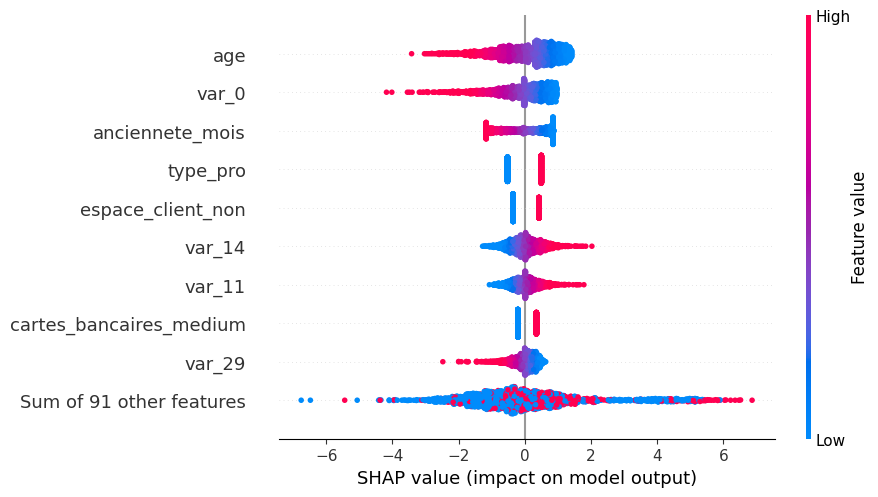

In [ ]:
shap.plots.beeswarm(shap_values)

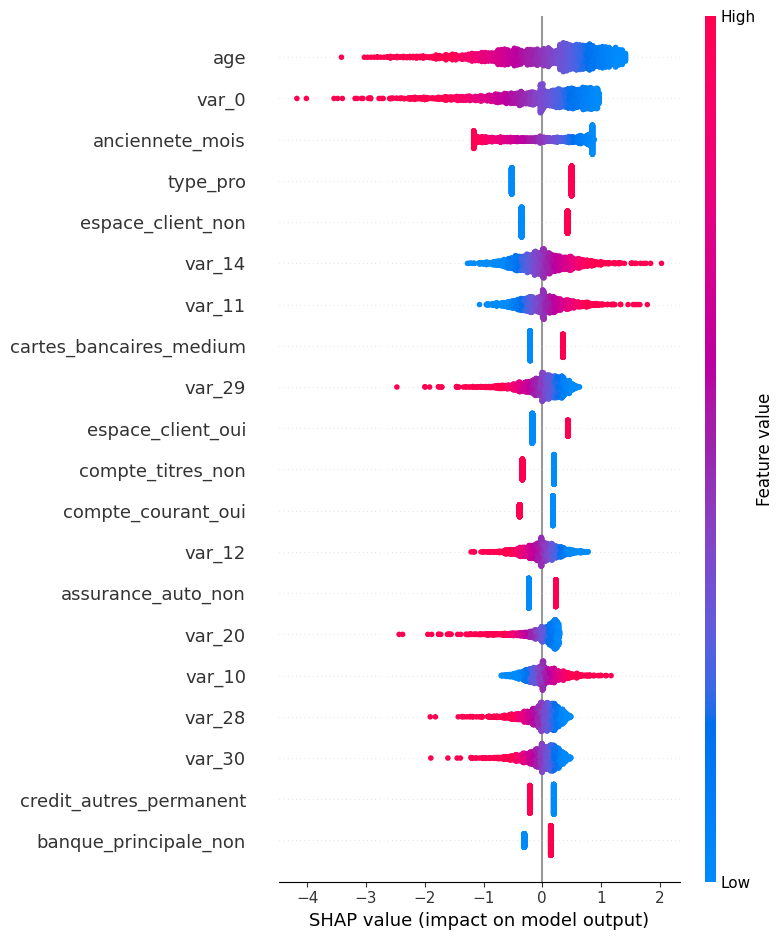

In [ ]:
shap.summary_plot(shap_values, X_test)

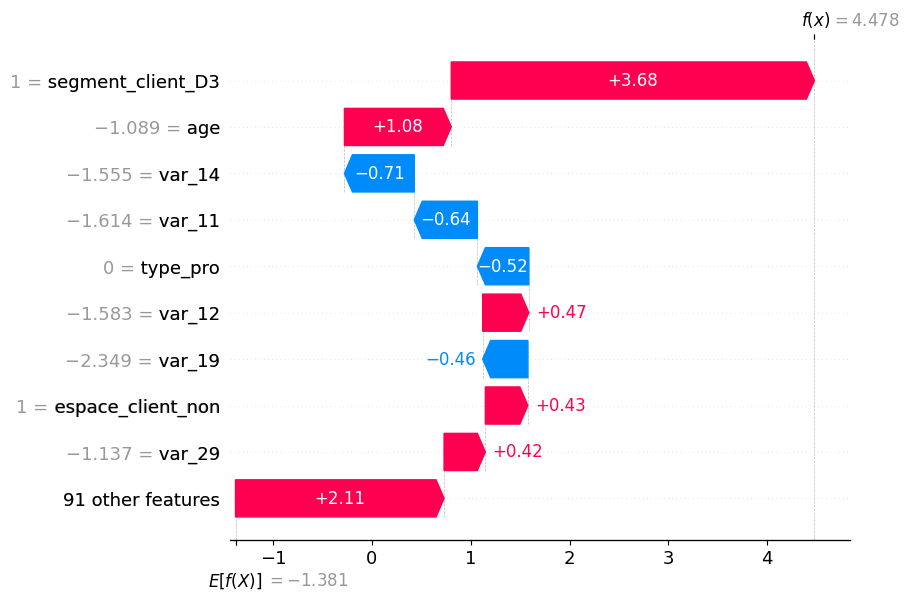

In [ ]:
shap.plots.waterfall(
    shap_values[0],
)

In [ ]:
from explainerdashboard import ClassifierExplainer


explainer = ClassifierExplainer(lr_model, X_test, y_test)

Note: model_output='probability' is currently not supported for linear classifiers models with shap. So defaulting to model_output='logodds' If you really need probability outputs use shap='kernel' instead.
Note: shap values for shap='linear' get calculated against X_background, but paramater X_background=None, so using X instead...
Generating self.shap_explainer = shap.LinearExplainer(model, X)...


In [ ]:
from explainerdashboard import ExplainerDashboard

ExplainerDashboard(explainer).run(mode="external", host="127.0.0.1")

Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:1086: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.


Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating dependencies...
Calculating permutation importances (if slow, try setting n_jobs parameter)...
Calculating predictions...
Calculating pred_percentiles...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.joblib') and reload with e.g. ClassifierExplainer.from_file('explainer.joblib')
Registering callbacks...
Building ExplainerDashboard..
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\dash\dash.py:538: UserWarning: JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:1086: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.


Calculating dependencies...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.joblib') and reload with e.g. ClassifierExplainer.from_file('explainer.joblib')
Registering callbacks...
Starting ExplainerDashboard on http://10.1.21.32:8050
You can terminate the dashboard with ExplainerDashboard.terminate(8050)


Dash app running on http://127.0.0.1:8050/


In [ ]:
y_test

array([ True, False,  True, ..., False, False, False])

In [ ]:
lr_pred_proba = lr_model.predict_proba(X_test)

lr_pred_proba

array([[1.12307863e-02, 9.88769214e-01],
       [9.99318123e-01, 6.81876828e-04],
       [6.58678690e-01, 3.41321310e-01],
       ...,
       [9.43139570e-01, 5.68604297e-02],
       [9.88977511e-01, 1.10224892e-02],
       [9.98335133e-01, 1.66486695e-03]])

In [ ]:
lr_pred_proba_df = pd.DataFrame(
    lr_pred_proba, columns=["proba_no_churn", "proba_churn"]
)


fig = px.histogram(lr_pred_proba_df, x="proba_churn")
fig.show()

In [ ]:
lr_pred

array([ True, False, False, ..., False, False, False])

## Single Prediction Explainability


In [ ]:
explainer_single = shap.LinearExplainer(lr_model, X_train.astype(float))
shap_values_single = explainer_single.shap_values(X_test.astype(float))

# we add back the feature names stripped by the StandardScaler
for i, c in enumerate(X_train.columns):
    shap_values.feature_names[i] = c

# we convert back to the original data
# (note we can do this because X_std is a set of univariate transformations of X)
shap_values.data = X_test_origin.values

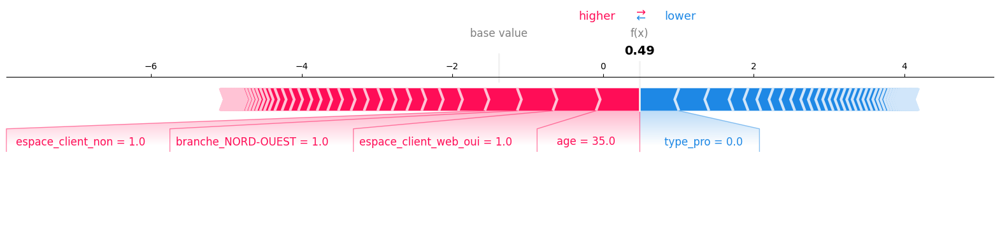

In [ ]:
id_client = 618

i = list(X_test.index).index(id_client)

shap.force_plot(
    explainer_single.expected_value,
    shap_values_single[i],
    X_test_origin.loc[id_client].values,
    feature_names=X_train.columns,
    matplotlib=True,
)

print()

In [ ]:
lr_pred_proba[i]

array([0.46229662, 0.53770338])

In [ ]:
shap_values.data

array([[0.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        6.33103914e+03, 7.27297113e+03, 6.95994852e+03],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        2.52723952e+04, 2.39557945e+04, 2.45033600e+04],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        1.01707433e+04, 9.24757679e+03, 1.22667277e+04],
       ...,
       [1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        2.03368230e+04, 1.88933454e+04, 2.59561362e+04],
       [1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        2.03870404e+04, 2.03840430e+04, 2.29521339e+04],
       [1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        3.33295551e+04, 3.65151994e+04, 4.22780483e+04]])

C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:1086: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:1086: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed i

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []


C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
C:\Users\HO.CAZEFACK\AppData\Roaming\Python\Python310\site-packages\explainerdashboard\explainer_methods.py:418: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

                             col  contribution     value
0                        genre_H      0.024643  0.000000
1                  genre_inconnu     -0.000000  0.000000
2          espace_client_web_non      0.087094  1.000000
3          espace_client_web_oui     -0.141718  0.000000
4              assurance_vie_non     -0.017164  1.000000
5              assurance_vie_oui      0.017210  0.000000
6          banque_principale_non      0.099070  1.000000
7          banque_principale_oui     -0.032296  0.000000
8             compte_epargne_non     -0.010916  0.000000
9             compte_epargne_oui      0.033258  1.000000
10    credit_autres_consommation     -0.037964  1.000000
11         credit_autres_inconnu      0.009635  0.000000
13      cartes_bancaires_inconnu     -0.003205  0.000000
15      cartes_bancaires_premium      0.058985  0.000000
16            compte_courant_non     -0.148464  1.000000
17            compte_courant_oui      0.175531  0.000000
20                       PEA_no